# Setup

In [1]:
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
from ydata_profiling import ProfileReport
from statsmodels.multivariate.manova import MANOVA

from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import statsmodels
print(statsmodels.__version__)

0.14.0


# Laod Data

In [3]:
filename = './Results/output02.csv'
df = pd.read_csv(filename, header=0, index_col=0)
df.head()

,rt,self_sex,self_age,target_likedislike,target_sex,IOS_score,IOS_group,Adj_cosine,Adj_euclidean,Adj_manhattan,Verb_cosine,Verb_euclidean,Verb_manhattan,Noun_cosine,Noun_euclidean,Noun_manhattan
MID,,,,,,,,,,,,,,,,
2,193.0,1,45,3,2,5,HighIOS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,137.0,1,36,4,2,2,LowIOS,NaN,NaN,NaN,0.933851,0.344139,1.932724,0.882830,0.469692,2.609289
7,293.0,1,54,1,2,5,HighIOS,0.489526,0.77925,4.465907,0.826740,0.433577,2.556113,0.035336,1.129285,6.480907
8,103.0,1,36,1,2,1,LowIOS,NaN,NaN,NaN,NaN,NaN,NaN,0.397660,1.097579,6.200497
11,160.0,1,56,1,2,2,LowIOS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.isnull().sum()

rt                      0
self_sex                0
self_age                0
target_likedislike      0
target_sex              0
IOS_score               0
IOS_group               0
Adj_cosine            184
Adj_euclidean         184
Adj_manhattan         184
Verb_cosine           152
Verb_euclidean        152
Verb_manhattan        152
Noun_cosine           157
Noun_euclidean        157
Noun_manhattan        157
dtype: int64

# Data Profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

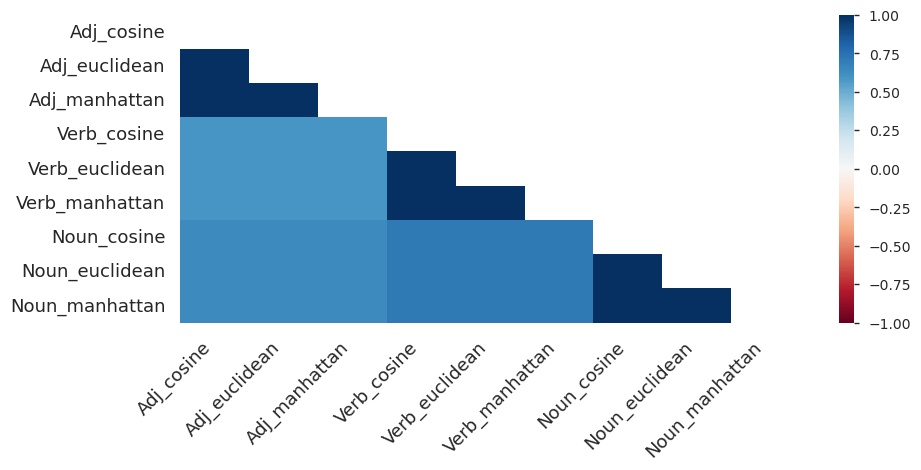

In [5]:
ProfileReport(df, title="Profiling Report")

# Descriptive Statistics (High IOS vs. Low IOS)

In [6]:
df.groupby("IOS_group")["rt"].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_group,,,,,,,,
HighIOS,203.0,3054.167488,18420.541590,89.0,196.5,291.0,543.50,227706.0
LowIOS,200.0,586.815000,1644.464584,76.0,210.0,309.5,502.25,22147.0


In [7]:
df.groupby("IOS_group")["self_sex"].value_counts()

IOS_group  self_sex
HighIOS    1           111
           2            89
           4             3
LowIOS     1           104
           2            96
Name: count, dtype: int64

In [8]:
df.groupby("IOS_group")["self_age"].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_group,,,,,,,,
HighIOS,203.0,46.921182,9.284486,21.0,40.5,49.0,55.0,59.0
LowIOS,200.0,48.015000,8.410019,21.0,43.0,50.0,55.0,59.0


In [9]:
df.groupby("IOS_group")["target_likedislike"].value_counts()

IOS_group  target_likedislike
HighIOS    1                     62
           4                     50
           2                     38
           5                     20
           6                     18
           3                     15
LowIOS     4                     65
           3                     47
           2                     31
           1                     26
           5                     16
           6                     15
Name: count, dtype: int64

In [10]:
df.groupby("IOS_group")["target_sex"].value_counts()

IOS_group  target_sex
HighIOS    2             117
           1              75
           4               8
           3               3
LowIOS     2             100
           1              92
           4               7
           3               1
Name: count, dtype: int64

In [11]:
df.groupby("IOS_group")["IOS_score"].value_counts()

IOS_group  IOS_score
HighIOS    6            72
           7            66
           5            65
LowIOS     2            75
           1            65
           3            60
Name: count, dtype: int64

In [12]:
df.groupby("IOS_group")["Adj_cosine"].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_group,,,,,,,,
HighIOS,109.0,0.660472,0.226336,0.076658,0.489526,0.697554,0.824959,1.0
LowIOS,110.0,0.627464,0.224798,0.076291,0.492899,0.662165,0.790882,1.0


In [13]:
df.groupby("IOS_group")["Verb_cosine"].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_group,,,,,,,,
HighIOS,120.0,0.692534,0.220782,-0.045727,0.576908,0.750317,0.852117,1.0
LowIOS,131.0,0.677681,0.215977,-0.017176,0.579123,0.728524,0.821311,1.0


In [14]:
df.groupby("IOS_group")["Noun_cosine"].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_group,,,,,,,,
HighIOS,118.0,0.669466,0.220079,0.035336,0.556167,0.707805,0.831895,1.0
LowIOS,128.0,0.627415,0.203571,0.032985,0.519752,0.664231,0.785747,1.0


# Cosine Similarity of Adjectives

In [18]:
# The number of missing values in the Adj_cosine column
num_nan_adj = df["Adj_cosine"].isnull().sum()
print(num_nan_adj)

184


In [19]:
# Select the rows where the Adj_cosine column is not NaN
df_adj = df[df["Adj_cosine"].notnull()]
df_adj.head()

,rt,self_sex,self_age,target_likedislike,target_sex,IOS_score,IOS_group,Adj_cosine,Adj_euclidean,Adj_manhattan,Verb_cosine,Verb_euclidean,Verb_manhattan,Noun_cosine,Noun_euclidean,Noun_manhattan
MID,,,,,,,,,,,,,,,,
7,293.0,1,54,1,2,5,HighIOS,0.489526,7.792499e-01,4.465907e+00,0.826740,0.433577,2.556113,0.035336,1.129285,6.480907
36,267.0,2,50,2,1,1,LowIOS,0.210237,1.196041e+00,6.727259e+00,NaN,NaN,NaN,0.298261,1.184685,7.141793
41,205.0,1,46,2,2,1,LowIOS,1.000000,1.490116e-08,3.352761e-08,NaN,NaN,NaN,NaN,NaN,NaN
44,156.0,1,53,4,2,5,HighIOS,0.608727,7.986725e-01,4.502885e+00,0.293749,1.005960,5.296038,NaN,NaN,NaN
47,286.0,2,49,1,2,1,LowIOS,0.343798,9.098678e-01,5.381318e+00,0.767628,0.551194,3.338891,0.868594,0.384930,2.128364


In [20]:
# Descriptive statistics of self_age by IOS group and self_sex
df_adj.groupby(['IOS_group', 'self_sex'])['self_age'].describe()

count       mean       std   min    25%   50%    75%   max
IOS_group self_sex                                                            
HighIOS   1          59.0  48.864407  8.597228  24.0  44.00  51.0  55.50  59.0
          2          49.0  46.020408  9.274719  21.0  42.00  48.0  54.00  58.0
          4           1.0  41.000000       NaN  41.0  41.00  41.0  41.00  41.0
LowIOS    1          56.0  50.285714  6.943183  33.0  45.75  52.0  56.25  59.0
          2          54.0  47.203704  8.947182  24.0  41.25  49.0  54.00  59.0

           count         mean           std    min    25%    50%    75%  \
IOS_group                                                                 
HighIOS    109.0  2331.660550  10638.741259   89.0  223.0  341.0  629.0   
LowIOS     110.0   828.272727   2171.799735  106.0  298.0  445.0  749.0   

               max  
IOS_group           
HighIOS    89172.0  
LowIOS     22147.0  


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


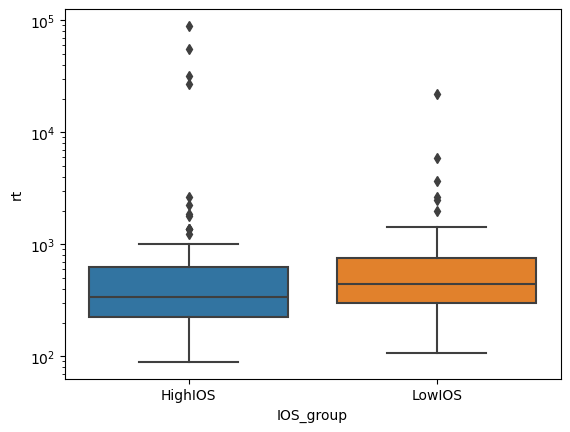

In [21]:
# Descriptive statistics of rt by IOS group
print(df_adj.groupby('IOS_group')['rt'].describe())
# Boxplot of rt by IOS group with y-log scale
sns.boxplot(x='IOS_group', y='rt', data=df_adj)
plt.yscale('log')
plt.show()  

IOS_group  target_likedislike
HighIOS    1                     39
           2                     19
           3                      4
           4                     32
           5                      9
           6                      6
LowIOS     1                      9
           2                     21
           3                     23
           4                     41
           5                      7
           6                      9
Name: rt, dtype: int64


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

<Axes: xlabel='target_likedislike', ylabel='count'>

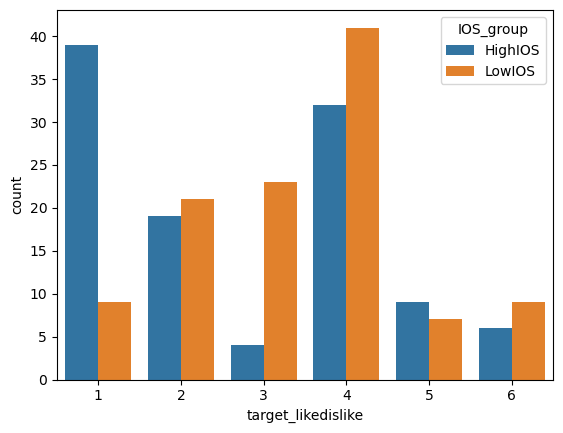

In [22]:
# The number of occurrences of each value in the target_likedislike column with respect to the IOS group
print(df_adj.groupby(['IOS_group', 'target_likedislike'])['rt'].count())
# The count plot of the target_likedislike column with respect to the IOS group
sns.countplot(x='target_likedislike', hue='IOS_group', data=df_adj)

In [23]:
# Add a new column for whether the self_sex differs from the target_sex
df_adj.loc[:, 'diff_sex'] = df_adj['self_sex'] != df_adj['target_sex']
# The count of occurrence of each value in the diff_sex with the respect of the IOS_group
df_adj.groupby('IOS_group')['diff_sex'].value_counts()

/tmp/ipykernel_3325/2759485611.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_adj.loc[:, 'diff_sex'] = df_adj['self_sex'] != df_adj['target_sex']


IOS_group  diff_sex
HighIOS    True        82
           False       27
LowIOS     True        71
           False       39
Name: count, dtype: int64

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

           count      mean       std       min       25%       50%       75%  \
IOS_group                                                                      
HighIOS    109.0  0.660472  0.226336  0.076658  0.489526  0.697554  0.824959   
LowIOS     110.0  0.627464  0.224798  0.076291  0.492899  0.662165  0.790882   

           max  
IOS_group       
HighIOS    1.0  
LowIOS     1.0  


<Axes: xlabel='Adj_cosine', ylabel='Count'>

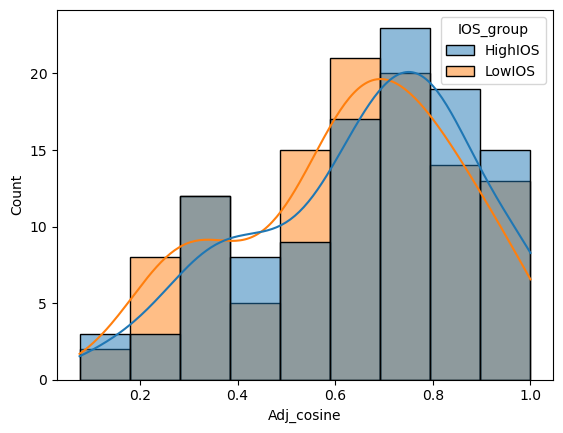

In [24]:
# The descriptive statistics of the Adj_cosine column with respect to the IOS group
print(df_adj.groupby('IOS_group')['Adj_cosine'].describe()) 
# The histogram of the Adj_cosine column with respect to the IOS group
sns.histplot(data=df_adj, x='Adj_cosine', hue='IOS_group', kde=True)

# Cosine Similarity of Verbs

In [25]:
# The number of missing values in the Verb_cosine column
num_nan_verb = df["Verb_cosine"].isnull().sum()
print(num_nan_verb)

152


In [26]:
# Select the rows where the Verb_cosine column is not NaN
df_verb = df[df["Verb_cosine"].notnull()]
df_verb.head()

,rt,self_sex,self_age,target_likedislike,target_sex,IOS_score,IOS_group,Adj_cosine,Adj_euclidean,Adj_manhattan,Verb_cosine,Verb_euclidean,Verb_manhattan,Noun_cosine,Noun_euclidean,Noun_manhattan
MID,,,,,,,,,,,,,,,,
5,137.0,1,36,4,2,2,LowIOS,NaN,NaN,NaN,0.933851,0.344139,1.932724,0.882830,0.469692,2.609289
7,293.0,1,54,1,2,5,HighIOS,0.489526,0.77925,4.465907,0.826740,0.433577,2.556113,0.035336,1.129285,6.480907
27,236.0,1,53,1,2,1,LowIOS,NaN,NaN,NaN,0.849437,0.378873,2.226377,0.883261,0.382761,2.182107
28,85.0,1,43,3,1,2,LowIOS,NaN,NaN,NaN,1.000000,0.000000,0.000000,NaN,NaN,NaN
40,330.0,1,59,3,2,2,LowIOS,NaN,NaN,NaN,0.795715,0.496866,2.697301,NaN,NaN,NaN


In [27]:
# The descriptive statistics of self_age with respect to IOS group and self_sex
df_verb.groupby(['IOS_group', 'self_sex'])['self_age'].describe()

count       mean       std   min    25%   50%   75%   max
IOS_group self_sex                                                           
HighIOS   1          64.0  48.890625  8.801366  24.0  44.00  52.0  56.0  59.0
          2          56.0  45.910714  8.834389  26.0  39.75  48.0  53.0  58.0
LowIOS    1          66.0  49.969697  7.489418  33.0  45.00  52.0  56.0  59.0
          2          65.0  46.292308  9.393687  21.0  40.00  49.0  54.0  59.0

           count         mean           std   min    25%    50%    75%  \
IOS_group                                                                
HighIOS    120.0  2288.516667  10163.703174  89.0  252.0  378.5  690.5   
LowIOS     131.0   715.656489   1983.296920  85.0  265.5  424.0  642.0   

               max  
IOS_group           
HighIOS    89172.0  
LowIOS     22147.0  


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


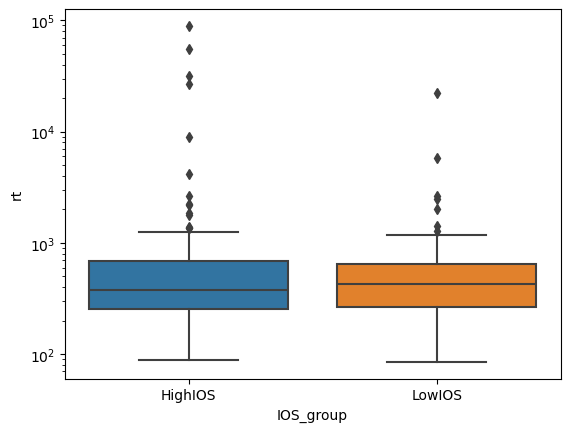

In [28]:
# The descriptive statistics of rt with respect to IOS group
print(df_verb.groupby('IOS_group')['rt'].describe())
# The boxplot of rt with respect to IOS group
sns.boxplot(x='IOS_group', y='rt', data=df_verb, order=['HighIOS', 'LowIOS'])
plt.yscale('log')
plt.show()

IOS_group  target_likedislike
HighIOS    1                     44
           2                     28
           3                      3
           4                     32
           5                      9
           6                      4
LowIOS     1                     16
           2                     21
           3                     26
           4                     45
           5                     12
           6                     11
Name: rt, dtype: int64


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='target_likedislike', ylabel='count'>

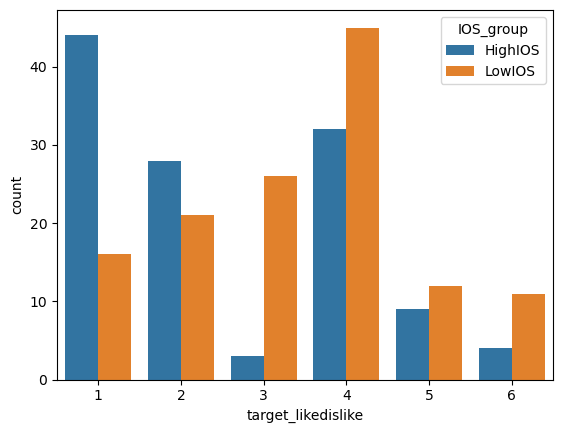

In [29]:
# The number of occurrences of each value in the target_likedislike column with respect to the IOS group
print(df_verb.groupby(['IOS_group', 'target_likedislike'])['rt'].count())
# The count plot of the target_likedislike column with respect to the IOS group
sns.countplot(x='target_likedislike', hue='IOS_group', data=df_verb, hue_order=['HighIOS', 'LowIOS']) 

In [30]:
# Add a new column for whether the self_sex differs from the target_sex
df_verb.loc[:, 'diff_sex'] = df_verb['self_sex'] != df_verb['target_sex']
# The count of occurrence of each value in the diff_sex column with the respect of the IOS_group
df_verb.groupby('IOS_group')['diff_sex'].value_counts()

/tmp/ipykernel_3325/1065005110.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_verb.loc[:, 'diff_sex'] = df_verb['self_sex'] != df_verb['target_sex']


IOS_group  diff_sex
HighIOS    True        92
           False       28
LowIOS     True        85
           False       46
Name: count, dtype: int64

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.u

           count      mean       std       min       25%       50%       75%  \
IOS_group                                                                      
HighIOS    120.0  0.692534  0.220782 -0.045727  0.576908  0.750317  0.852117   
LowIOS     131.0  0.677681  0.215977 -0.017176  0.579123  0.728524  0.821311   

           max  
IOS_group       
HighIOS    1.0  
LowIOS     1.0  


<Axes: xlabel='Verb_cosine', ylabel='Count'>

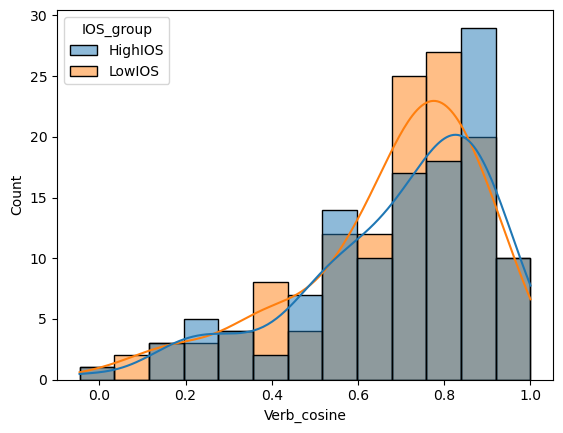

In [31]:
# The descriptive statistics of the Verb_cosine column with respect to the IOS group
print(df_verb.groupby('IOS_group')['Verb_cosine'].describe())
# The histogram of the Verb_cosine column with respect to the IOS group
sns.histplot(data=df_verb, x='Verb_cosine', hue='IOS_group', kde=True, hue_order=['HighIOS', 'LowIOS'])

# Cosine Similarity of Nouns

In [32]:
# The number of missing values in the Noun_cosine column
num_nan_noun = df["Noun_cosine"].isnull().sum()
print(num_nan_noun)

157


In [33]:
# Select the rows where the Noun_cosine column is not NaN
df_noun = df[df["Noun_cosine"].notnull()]
df_noun.head()

,rt,self_sex,self_age,target_likedislike,target_sex,IOS_score,IOS_group,Adj_cosine,Adj_euclidean,Adj_manhattan,Verb_cosine,Verb_euclidean,Verb_manhattan,Noun_cosine,Noun_euclidean,Noun_manhattan
MID,,,,,,,,,,,,,,,,
5,137.0,1,36,4,2,2,LowIOS,NaN,NaN,NaN,0.933851,0.344139,1.932724,0.882830,0.469692,2.609289
7,293.0,1,54,1,2,5,HighIOS,0.489526,0.77925,4.465907,0.826740,0.433577,2.556113,0.035336,1.129285,6.480907
8,103.0,1,36,1,2,1,LowIOS,NaN,NaN,NaN,NaN,NaN,NaN,0.397660,1.097579,6.200497
27,236.0,1,53,1,2,1,LowIOS,NaN,NaN,NaN,0.849437,0.378873,2.226377,0.883261,0.382761,2.182107
31,210.0,1,53,4,2,3,LowIOS,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000


In [34]:
# The descriptive statistics of self_age with respect to IOS group and self_sex
df_noun.groupby(['IOS_group', 'self_sex'])['self_age'].describe()

count       mean       std   min   25%   50%   75%   max
IOS_group self_sex                                                          
HighIOS   1          64.0  48.609375  8.925827  24.0  44.0  51.5  56.0  59.0
          2          53.0  46.207547  8.826007  26.0  40.0  48.0  54.0  58.0
          4           1.0  41.000000       NaN  41.0  41.0  41.0  41.0  41.0
LowIOS    1          65.0  49.446154  7.516712  33.0  45.0  52.0  55.0  59.0
          2          63.0  47.000000  9.041125  24.0  40.5  49.0  54.0  59.0

           count         mean          std    min    25%    50%     75%  \
IOS_group                                                                 
HighIOS    118.0  1821.762712  8982.657805   91.0  250.5  366.5  626.25   
LowIOS     128.0   744.304688  2022.897966  103.0  265.0  409.5  645.00   

               max  
IOS_group           
HighIOS    89172.0  
LowIOS     22147.0  


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


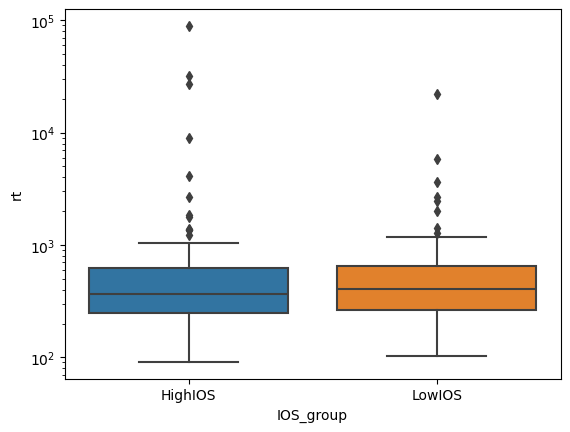

In [35]:
# The descriptive statistics of rt with respect to IOS group
print(df_noun.groupby('IOS_group')['rt'].describe())
# The boxplot of rt with respect to IOS group
sns.boxplot(x='IOS_group', y='rt', data=df_noun, order=['HighIOS', 'LowIOS'])
plt.yscale('log')
plt.show()

IOS_group  target_likedislike
HighIOS    1                     43
           2                     23
           3                      5
           4                     32
           5                     10
           6                      5
LowIOS     1                     17
           2                     19
           3                     23
           4                     47
           5                     11
           6                     11
Name: rt, dtype: int64


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='target_likedislike', ylabel='count'>

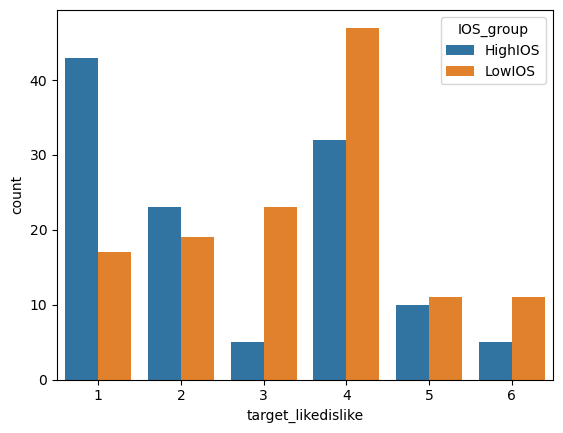

In [36]:
# The number of occurrences of each value in the target_likedislike column with respect to the IOS group
print(df_noun.groupby(['IOS_group', 'target_likedislike'])['rt'].count())
# The count plot of the target_likedislike column with respect to the IOS group
sns.countplot(x='target_likedislike', hue='IOS_group', data=df_noun, hue_order=['HighIOS', 'LowIOS'])

In [37]:
# Add a new column for whether the self_sex differs from the target_sex
df_noun.loc[:, 'diff_sex'] = df_noun['self_sex'] != df_noun['target_sex']
# The count of occurrence of each value in the diff_sex with the respect of the IOS_group
df_noun.groupby('IOS_group')['diff_sex'].value_counts()

/tmp/ipykernel_3325/2190745943.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noun.loc[:, 'diff_sex'] = df_noun['self_sex'] != df_noun['target_sex']


IOS_group  diff_sex
HighIOS    True        92
           False       26
LowIOS     True        84
           False       44
Name: count, dtype: int64

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.u

           count      mean       std       min       25%       50%       75%  \
IOS_group                                                                      
HighIOS    118.0  0.669466  0.220079  0.035336  0.556167  0.707805  0.831895   
LowIOS     128.0  0.627415  0.203571  0.032985  0.519752  0.664231  0.785747   

           max  
IOS_group       
HighIOS    1.0  
LowIOS     1.0  


<Axes: xlabel='Noun_cosine', ylabel='Count'>

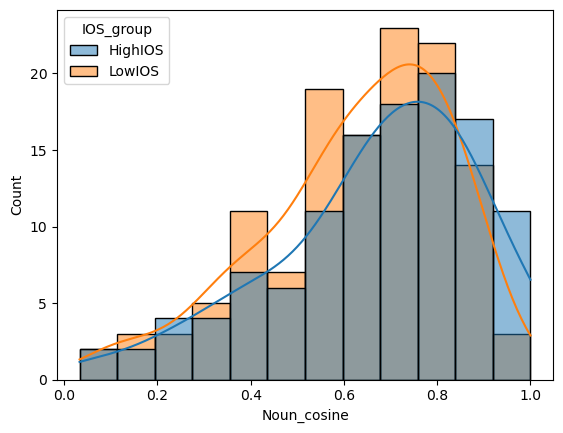

In [38]:
# The descriptive statistics of the Noun_cosine column with respect to the IOS group
print(df_noun.groupby('IOS_group')['Noun_cosine'].describe())
# The histogram of the Noun_cosine column with respect to the IOS group
sns.histplot(data=df_noun, x='Noun_cosine', hue='IOS_group', kde=True, hue_order=['HighIOS', 'LowIOS'])